# DCGAN
Original DCGAN Code & visualizations largely from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html.

Adapted to run on smaller images.

In [1]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


## Hyperparams

In [2]:
dataroot = "data/PetImages/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 32

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 10

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 0

## Data Prep

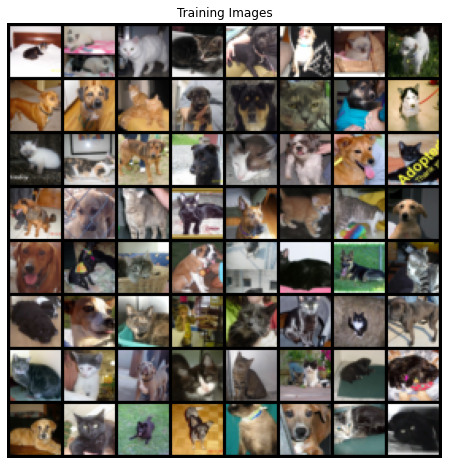

In [3]:
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## Model

In [4]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (nc) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [6]:
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 32 x 32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 16 x 16
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 8 x 8
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 4 x 4
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)


In [9]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## Training

In [10]:

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 1 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/10][0/391]	Loss_D: 1.4988	Loss_G: 2.0570	D(x): 0.4054	D(G(z)): 0.3915 / 0.1463
[0/10][1/391]	Loss_D: 1.2480	Loss_G: 2.1660	D(x): 0.6036	D(G(z)): 0.4766 / 0.1360
[0/10][2/391]	Loss_D: 1.0857	Loss_G: 2.3300	D(x): 0.6476	D(G(z)): 0.4362 / 0.1120
[0/10][3/391]	Loss_D: 1.0884	Loss_G: 2.3951	D(x): 0.6430	D(G(z)): 0.4213 / 0.1046
[0/10][4/391]	Loss_D: 0.9425	Loss_G: 2.6376	D(x): 0.6907	D(G(z)): 0.3886 / 0.0830
[0/10][5/391]	Loss_D: 0.9834	Loss_G: 2.7646	D(x): 0.6659	D(G(z)): 0.3815 / 0.0767
[0/10][6/391]	Loss_D: 0.9063	Loss_G: 2.9674	D(x): 0.6776	D(G(z)): 0.3628 / 0.0641
[0/10][7/391]	Loss_D: 0.8552	Loss_G: 3.1590	D(x): 0.6899	D(G(z)): 0.3469 / 0.0521
[0/10][8/391]	Loss_D: 0.8512	Loss_G: 3.3103	D(x): 0.6841	D(G(z)): 0.3333 / 0.0422
[0/10][9/391]	Loss_D: 0.8797	Loss_G: 3.3904	D(x): 0.7245	D(G(z)): 0.3898 / 0.0412
[0/10][10/391]	Loss_D: 0.9514	Loss_G: 3.6017	D(x): 0.7003	D(G(z)): 0.4035 / 0.0338
[0/10][11/391]	Loss_D: 0.9569	Loss_G: 3.7097	D(x): 0.6722	D(G(z)): 0.37

[0/10][99/391]	Loss_D: 0.4503	Loss_G: 7.1559	D(x): 0.9086	D(G(z)): 0.2696 / 0.0016
[0/10][100/391]	Loss_D: 0.2812	Loss_G: 5.7808	D(x): 0.8165	D(G(z)): 0.0386 / 0.0103
[0/10][101/391]	Loss_D: 0.3104	Loss_G: 5.8126	D(x): 0.8791	D(G(z)): 0.1220 / 0.0055
[0/10][102/391]	Loss_D: 0.2886	Loss_G: 6.0594	D(x): 0.9110	D(G(z)): 0.1522 / 0.0037
[0/10][103/391]	Loss_D: 0.3586	Loss_G: 4.2542	D(x): 0.8154	D(G(z)): 0.1023 / 0.0256
[0/10][104/391]	Loss_D: 0.6729	Loss_G: 9.2475	D(x): 0.8696	D(G(z)): 0.3588 / 0.0006
[0/10][105/391]	Loss_D: 1.6580	Loss_G: 2.7189	D(x): 0.3638	D(G(z)): 0.0138 / 0.1106
[0/10][106/391]	Loss_D: 0.8249	Loss_G: 5.1003	D(x): 0.9206	D(G(z)): 0.4489 / 0.0151
[0/10][107/391]	Loss_D: 0.4208	Loss_G: 5.3523	D(x): 0.8294	D(G(z)): 0.1451 / 0.0080
[0/10][108/391]	Loss_D: 0.3043	Loss_G: 4.0013	D(x): 0.8268	D(G(z)): 0.0647 / 0.0309
[0/10][109/391]	Loss_D: 0.3995	Loss_G: 2.8691	D(x): 0.8081	D(G(z)): 0.1268 / 0.0756
[0/10][110/391]	Loss_D: 0.6021	Loss_G: 4.9051	D(x): 0.9000	D(G(z)): 0.3552 / 

[0/10][197/391]	Loss_D: 0.5214	Loss_G: 4.9073	D(x): 0.7277	D(G(z)): 0.1041 / 0.0121
[0/10][198/391]	Loss_D: 0.5403	Loss_G: 4.4436	D(x): 0.8139	D(G(z)): 0.2108 / 0.0166
[0/10][199/391]	Loss_D: 0.5835	Loss_G: 5.2873	D(x): 0.8460	D(G(z)): 0.2948 / 0.0069
[0/10][200/391]	Loss_D: 0.7487	Loss_G: 3.3441	D(x): 0.6498	D(G(z)): 0.1270 / 0.0608
[0/10][201/391]	Loss_D: 1.3051	Loss_G: 7.4289	D(x): 0.8532	D(G(z)): 0.5831 / 0.0011
[0/10][202/391]	Loss_D: 1.5173	Loss_G: 3.6873	D(x): 0.3118	D(G(z)): 0.0186 / 0.0626
[0/10][203/391]	Loss_D: 0.9293	Loss_G: 4.2941	D(x): 0.7720	D(G(z)): 0.3907 / 0.0238
[0/10][204/391]	Loss_D: 0.5808	Loss_G: 5.5578	D(x): 0.8321	D(G(z)): 0.2737 / 0.0059
[0/10][205/391]	Loss_D: 0.5770	Loss_G: 4.0134	D(x): 0.7035	D(G(z)): 0.1035 / 0.0264
[0/10][206/391]	Loss_D: 0.7383	Loss_G: 5.7494	D(x): 0.8398	D(G(z)): 0.3694 / 0.0049
[0/10][207/391]	Loss_D: 0.4580	Loss_G: 4.8718	D(x): 0.7593	D(G(z)): 0.1089 / 0.0115
[0/10][208/391]	Loss_D: 0.6793	Loss_G: 4.3554	D(x): 0.7041	D(G(z)): 0.2142 /

[0/10][295/391]	Loss_D: 0.3374	Loss_G: 3.8189	D(x): 0.7772	D(G(z)): 0.0456 / 0.0317
[0/10][296/391]	Loss_D: 0.4587	Loss_G: 4.9622	D(x): 0.9364	D(G(z)): 0.2985 / 0.0107
[0/10][297/391]	Loss_D: 0.4287	Loss_G: 3.4356	D(x): 0.7491	D(G(z)): 0.0574 / 0.0484
[0/10][298/391]	Loss_D: 0.4542	Loss_G: 4.8537	D(x): 0.9361	D(G(z)): 0.2707 / 0.0171
[0/10][299/391]	Loss_D: 0.5087	Loss_G: 3.3893	D(x): 0.7237	D(G(z)): 0.1189 / 0.0556
[0/10][300/391]	Loss_D: 0.4903	Loss_G: 3.9866	D(x): 0.8347	D(G(z)): 0.2312 / 0.0313
[0/10][301/391]	Loss_D: 0.4054	Loss_G: 4.8006	D(x): 0.8855	D(G(z)): 0.2048 / 0.0179
[0/10][302/391]	Loss_D: 0.8591	Loss_G: 2.3000	D(x): 0.5630	D(G(z)): 0.0809 / 0.1651
[0/10][303/391]	Loss_D: 0.8850	Loss_G: 5.0833	D(x): 0.8908	D(G(z)): 0.4744 / 0.0100
[0/10][304/391]	Loss_D: 0.6852	Loss_G: 3.6917	D(x): 0.6208	D(G(z)): 0.0581 / 0.0420
[0/10][305/391]	Loss_D: 0.5387	Loss_G: 3.0295	D(x): 0.8018	D(G(z)): 0.1982 / 0.0721
[0/10][306/391]	Loss_D: 0.5236	Loss_G: 3.1386	D(x): 0.7819	D(G(z)): 0.1976 /

[1/10][2/391]	Loss_D: 0.8960	Loss_G: 2.4519	D(x): 0.6752	D(G(z)): 0.3267 / 0.1018
[1/10][3/391]	Loss_D: 0.7065	Loss_G: 2.5353	D(x): 0.6849	D(G(z)): 0.2366 / 0.0959
[1/10][4/391]	Loss_D: 0.6107	Loss_G: 2.7719	D(x): 0.7396	D(G(z)): 0.2325 / 0.0789
[1/10][5/391]	Loss_D: 0.5164	Loss_G: 3.2036	D(x): 0.7853	D(G(z)): 0.2132 / 0.0536
[1/10][6/391]	Loss_D: 0.4996	Loss_G: 2.6533	D(x): 0.7408	D(G(z)): 0.1492 / 0.0901
[1/10][7/391]	Loss_D: 0.5965	Loss_G: 3.1801	D(x): 0.7931	D(G(z)): 0.2674 / 0.0493
[1/10][8/391]	Loss_D: 0.4264	Loss_G: 2.9827	D(x): 0.7850	D(G(z)): 0.1365 / 0.0626
[1/10][9/391]	Loss_D: 0.5878	Loss_G: 2.2839	D(x): 0.7123	D(G(z)): 0.1651 / 0.1253
[1/10][10/391]	Loss_D: 0.5858	Loss_G: 3.3289	D(x): 0.8264	D(G(z)): 0.2878 / 0.0505
[1/10][11/391]	Loss_D: 0.4977	Loss_G: 3.1735	D(x): 0.7677	D(G(z)): 0.1611 / 0.0574
[1/10][12/391]	Loss_D: 0.4884	Loss_G: 2.9626	D(x): 0.7819	D(G(z)): 0.1664 / 0.0713
[1/10][13/391]	Loss_D: 0.6239	Loss_G: 3.3621	D(x): 0.7956	D(G(z)): 0.2589 / 0.0469
[1/10][14/39

[1/10][101/391]	Loss_D: 0.2250	Loss_G: 4.0219	D(x): 0.8919	D(G(z)): 0.0814 / 0.0229
[1/10][102/391]	Loss_D: 0.2838	Loss_G: 3.3409	D(x): 0.8567	D(G(z)): 0.1045 / 0.0432
[1/10][103/391]	Loss_D: 0.3699	Loss_G: 3.5157	D(x): 0.8597	D(G(z)): 0.1576 / 0.0353
[1/10][104/391]	Loss_D: 0.3194	Loss_G: 4.2717	D(x): 0.8975	D(G(z)): 0.1689 / 0.0186
[1/10][105/391]	Loss_D: 0.2899	Loss_G: 3.9439	D(x): 0.8209	D(G(z)): 0.0626 / 0.0271
[1/10][106/391]	Loss_D: 0.2231	Loss_G: 3.6880	D(x): 0.9016	D(G(z)): 0.0984 / 0.0339
[1/10][107/391]	Loss_D: 0.2498	Loss_G: 3.4635	D(x): 0.8861	D(G(z)): 0.1014 / 0.0414
[1/10][108/391]	Loss_D: 0.2455	Loss_G: 3.9450	D(x): 0.9001	D(G(z)): 0.1225 / 0.0236
[1/10][109/391]	Loss_D: 0.2684	Loss_G: 3.6450	D(x): 0.8697	D(G(z)): 0.1081 / 0.0308
[1/10][110/391]	Loss_D: 0.1751	Loss_G: 3.8435	D(x): 0.9204	D(G(z)): 0.0809 / 0.0274
[1/10][111/391]	Loss_D: 0.2258	Loss_G: 3.8364	D(x): 0.9086	D(G(z)): 0.1035 / 0.0292
[1/10][112/391]	Loss_D: 0.2619	Loss_G: 3.9996	D(x): 0.9126	D(G(z)): 0.1435 /

[1/10][199/391]	Loss_D: 0.6814	Loss_G: 4.7550	D(x): 0.8095	D(G(z)): 0.3090 / 0.0151
[1/10][200/391]	Loss_D: 0.5765	Loss_G: 3.7099	D(x): 0.6765	D(G(z)): 0.0849 / 0.0518
[1/10][201/391]	Loss_D: 0.7183	Loss_G: 3.4186	D(x): 0.7554	D(G(z)): 0.2552 / 0.0543
[1/10][202/391]	Loss_D: 0.9669	Loss_G: 6.1364	D(x): 0.8758	D(G(z)): 0.5028 / 0.0053
[1/10][203/391]	Loss_D: 1.1468	Loss_G: 3.5562	D(x): 0.4324	D(G(z)): 0.0216 / 0.0636
[1/10][204/391]	Loss_D: 0.5622	Loss_G: 4.4276	D(x): 0.8792	D(G(z)): 0.2844 / 0.0237
[1/10][205/391]	Loss_D: 0.6361	Loss_G: 3.0759	D(x): 0.7006	D(G(z)): 0.1370 / 0.0623
[1/10][206/391]	Loss_D: 0.7276	Loss_G: 4.6892	D(x): 0.8735	D(G(z)): 0.3902 / 0.0144
[1/10][207/391]	Loss_D: 0.7533	Loss_G: 2.8987	D(x): 0.6182	D(G(z)): 0.0748 / 0.0875
[1/10][208/391]	Loss_D: 0.4436	Loss_G: 3.5325	D(x): 0.8955	D(G(z)): 0.2617 / 0.0461
[1/10][209/391]	Loss_D: 0.3225	Loss_G: 4.1842	D(x): 0.8887	D(G(z)): 0.1570 / 0.0238
[1/10][210/391]	Loss_D: 0.3855	Loss_G: 3.2808	D(x): 0.8271	D(G(z)): 0.1509 /

[1/10][297/391]	Loss_D: 0.6515	Loss_G: 2.5903	D(x): 0.6616	D(G(z)): 0.1163 / 0.1156
[1/10][298/391]	Loss_D: 0.4997	Loss_G: 4.8861	D(x): 0.9231	D(G(z)): 0.3056 / 0.0130
[1/10][299/391]	Loss_D: 0.3089	Loss_G: 4.4014	D(x): 0.8089	D(G(z)): 0.0525 / 0.0191
[1/10][300/391]	Loss_D: 0.2150	Loss_G: 3.7019	D(x): 0.8707	D(G(z)): 0.0566 / 0.0391
[1/10][301/391]	Loss_D: 0.2417	Loss_G: 3.7721	D(x): 0.9453	D(G(z)): 0.1587 / 0.0329
[1/10][302/391]	Loss_D: 0.2108	Loss_G: 3.8574	D(x): 0.8996	D(G(z)): 0.0887 / 0.0296
[1/10][303/391]	Loss_D: 0.2073	Loss_G: 3.7411	D(x): 0.9098	D(G(z)): 0.0955 / 0.0323
[1/10][304/391]	Loss_D: 0.3992	Loss_G: 3.7528	D(x): 0.8704	D(G(z)): 0.1987 / 0.0345
[1/10][305/391]	Loss_D: 0.3735	Loss_G: 3.3716	D(x): 0.8156	D(G(z)): 0.1295 / 0.0462
[1/10][306/391]	Loss_D: 0.3680	Loss_G: 3.5772	D(x): 0.8553	D(G(z)): 0.1599 / 0.0397
[1/10][307/391]	Loss_D: 0.4694	Loss_G: 3.3219	D(x): 0.7860	D(G(z)): 0.1589 / 0.0505
[1/10][308/391]	Loss_D: 0.3363	Loss_G: 3.7527	D(x): 0.8733	D(G(z)): 0.1583 /

[2/10][4/391]	Loss_D: 0.1731	Loss_G: 4.8769	D(x): 0.9064	D(G(z)): 0.0529 / 0.0112
[2/10][5/391]	Loss_D: 0.2407	Loss_G: 4.3310	D(x): 0.8891	D(G(z)): 0.0809 / 0.0235
[2/10][6/391]	Loss_D: 0.1769	Loss_G: 5.1081	D(x): 0.9593	D(G(z)): 0.1172 / 0.0103
[2/10][7/391]	Loss_D: 0.2084	Loss_G: 4.6141	D(x): 0.9102	D(G(z)): 0.0843 / 0.0152
[2/10][8/391]	Loss_D: 0.4197	Loss_G: 4.1925	D(x): 0.8451	D(G(z)): 0.1602 / 0.0240
[2/10][9/391]	Loss_D: 0.3685	Loss_G: 5.4793	D(x): 0.9091	D(G(z)): 0.2124 / 0.0059
[2/10][10/391]	Loss_D: 0.4564	Loss_G: 4.1427	D(x): 0.7838	D(G(z)): 0.1318 / 0.0236
[2/10][11/391]	Loss_D: 0.5649	Loss_G: 3.4217	D(x): 0.7699	D(G(z)): 0.1735 / 0.0432
[2/10][12/391]	Loss_D: 0.8264	Loss_G: 6.1983	D(x): 0.8271	D(G(z)): 0.4114 / 0.0041
[2/10][13/391]	Loss_D: 1.0313	Loss_G: 3.4918	D(x): 0.4693	D(G(z)): 0.0271 / 0.0776
[2/10][14/391]	Loss_D: 0.4726	Loss_G: 4.4227	D(x): 0.9480	D(G(z)): 0.2919 / 0.0232
[2/10][15/391]	Loss_D: 0.3091	Loss_G: 4.1845	D(x): 0.8296	D(G(z)): 0.0853 / 0.0229
[2/10][16/

[2/10][103/391]	Loss_D: 0.2620	Loss_G: 3.3771	D(x): 0.8829	D(G(z)): 0.1050 / 0.0493
[2/10][104/391]	Loss_D: 0.2280	Loss_G: 3.2236	D(x): 0.9069	D(G(z)): 0.1120 / 0.0526
[2/10][105/391]	Loss_D: 0.2608	Loss_G: 3.2093	D(x): 0.9018	D(G(z)): 0.1318 / 0.0536
[2/10][106/391]	Loss_D: 0.3414	Loss_G: 3.0838	D(x): 0.8447	D(G(z)): 0.1260 / 0.0641
[2/10][107/391]	Loss_D: 0.3560	Loss_G: 3.5501	D(x): 0.8959	D(G(z)): 0.1929 / 0.0418
[2/10][108/391]	Loss_D: 0.2717	Loss_G: 3.3206	D(x): 0.8504	D(G(z)): 0.0849 / 0.0549
[2/10][109/391]	Loss_D: 0.3677	Loss_G: 3.1251	D(x): 0.8800	D(G(z)): 0.1870 / 0.0565
[2/10][110/391]	Loss_D: 0.2777	Loss_G: 3.3680	D(x): 0.8801	D(G(z)): 0.1228 / 0.0494
[2/10][111/391]	Loss_D: 0.4656	Loss_G: 2.7850	D(x): 0.7809	D(G(z)): 0.1519 / 0.0776
[2/10][112/391]	Loss_D: 0.4234	Loss_G: 3.5450	D(x): 0.8739	D(G(z)): 0.2280 / 0.0378
[2/10][113/391]	Loss_D: 0.3646	Loss_G: 3.0688	D(x): 0.7839	D(G(z)): 0.0782 / 0.0575
[2/10][114/391]	Loss_D: 0.5857	Loss_G: 2.9219	D(x): 0.7701	D(G(z)): 0.2427 /

[2/10][201/391]	Loss_D: 0.6484	Loss_G: 3.8786	D(x): 0.8540	D(G(z)): 0.3194 / 0.0307
[2/10][202/391]	Loss_D: 0.5939	Loss_G: 2.3133	D(x): 0.7027	D(G(z)): 0.1156 / 0.1454
[2/10][203/391]	Loss_D: 0.5906	Loss_G: 4.6570	D(x): 0.9008	D(G(z)): 0.3426 / 0.0136
[2/10][204/391]	Loss_D: 0.6911	Loss_G: 2.0834	D(x): 0.6197	D(G(z)): 0.0523 / 0.1644
[2/10][205/391]	Loss_D: 0.7566	Loss_G: 4.4681	D(x): 0.8773	D(G(z)): 0.4081 / 0.0188
[2/10][206/391]	Loss_D: 0.7504	Loss_G: 2.7524	D(x): 0.6358	D(G(z)): 0.1185 / 0.1258
[2/10][207/391]	Loss_D: 0.7532	Loss_G: 3.5079	D(x): 0.8197	D(G(z)): 0.3294 / 0.0486
[2/10][208/391]	Loss_D: 0.7490	Loss_G: 2.7998	D(x): 0.6607	D(G(z)): 0.1872 / 0.0935
[2/10][209/391]	Loss_D: 0.5851	Loss_G: 3.8620	D(x): 0.8650	D(G(z)): 0.2983 / 0.0321
[2/10][210/391]	Loss_D: 0.4982	Loss_G: 3.3683	D(x): 0.7379	D(G(z)): 0.0995 / 0.0510
[2/10][211/391]	Loss_D: 0.5239	Loss_G: 2.5232	D(x): 0.7700	D(G(z)): 0.1565 / 0.1320
[2/10][212/391]	Loss_D: 0.6007	Loss_G: 4.0332	D(x): 0.8825	D(G(z)): 0.3176 /

[2/10][299/391]	Loss_D: 0.8524	Loss_G: 3.9417	D(x): 0.9102	D(G(z)): 0.4893 / 0.0305
[2/10][300/391]	Loss_D: 0.5974	Loss_G: 2.4805	D(x): 0.6659	D(G(z)): 0.0921 / 0.1201
[2/10][301/391]	Loss_D: 0.4745	Loss_G: 3.5513	D(x): 0.8910	D(G(z)): 0.2756 / 0.0402
[2/10][302/391]	Loss_D: 0.3897	Loss_G: 2.7459	D(x): 0.7961	D(G(z)): 0.1259 / 0.0949
[2/10][303/391]	Loss_D: 0.3727	Loss_G: 3.0338	D(x): 0.8628	D(G(z)): 0.1748 / 0.0677
[2/10][304/391]	Loss_D: 0.3432	Loss_G: 3.5216	D(x): 0.8743	D(G(z)): 0.1691 / 0.0414
[2/10][305/391]	Loss_D: 0.2853	Loss_G: 2.9492	D(x): 0.8398	D(G(z)): 0.0871 / 0.0693
[2/10][306/391]	Loss_D: 0.3067	Loss_G: 3.1508	D(x): 0.8936	D(G(z)): 0.1551 / 0.0617
[2/10][307/391]	Loss_D: 0.3678	Loss_G: 2.8110	D(x): 0.8338	D(G(z)): 0.1450 / 0.0755
[2/10][308/391]	Loss_D: 0.3033	Loss_G: 3.7776	D(x): 0.9322	D(G(z)): 0.1853 / 0.0317
[2/10][309/391]	Loss_D: 0.4883	Loss_G: 2.4273	D(x): 0.7217	D(G(z)): 0.0840 / 0.1192
[2/10][310/391]	Loss_D: 0.4853	Loss_G: 3.9858	D(x): 0.9294	D(G(z)): 0.3027 /

[3/10][6/391]	Loss_D: 0.3838	Loss_G: 4.4726	D(x): 0.9434	D(G(z)): 0.2516 / 0.0203
[3/10][7/391]	Loss_D: 0.2529	Loss_G: 3.9414	D(x): 0.8290	D(G(z)): 0.0446 / 0.0302
[3/10][8/391]	Loss_D: 0.3761	Loss_G: 3.1375	D(x): 0.8511	D(G(z)): 0.1705 / 0.0689
[3/10][9/391]	Loss_D: 0.4935	Loss_G: 3.7684	D(x): 0.8448	D(G(z)): 0.2315 / 0.0340
[3/10][10/391]	Loss_D: 0.8719	Loss_G: 1.5611	D(x): 0.5854	D(G(z)): 0.1852 / 0.2693
[3/10][11/391]	Loss_D: 1.2178	Loss_G: 6.1245	D(x): 0.9229	D(G(z)): 0.6166 / 0.0042
[3/10][12/391]	Loss_D: 1.1395	Loss_G: 2.4310	D(x): 0.4143	D(G(z)): 0.0207 / 0.1376
[3/10][13/391]	Loss_D: 0.6229	Loss_G: 2.9531	D(x): 0.8682	D(G(z)): 0.3209 / 0.0808
[3/10][14/391]	Loss_D: 0.5015	Loss_G: 3.4396	D(x): 0.8154	D(G(z)): 0.2093 / 0.0474
[3/10][15/391]	Loss_D: 0.7121	Loss_G: 2.3025	D(x): 0.6958	D(G(z)): 0.1813 / 0.1577
[3/10][16/391]	Loss_D: 0.9314	Loss_G: 3.4258	D(x): 0.7521	D(G(z)): 0.3887 / 0.0469
[3/10][17/391]	Loss_D: 0.4505	Loss_G: 2.8289	D(x): 0.7597	D(G(z)): 0.1092 / 0.0777
[3/10][1

[3/10][105/391]	Loss_D: 0.5462	Loss_G: 2.7843	D(x): 0.7801	D(G(z)): 0.2046 / 0.0862
[3/10][106/391]	Loss_D: 0.4818	Loss_G: 3.4239	D(x): 0.8607	D(G(z)): 0.2207 / 0.0530
[3/10][107/391]	Loss_D: 0.4692	Loss_G: 3.2508	D(x): 0.7753	D(G(z)): 0.1559 / 0.0606
[3/10][108/391]	Loss_D: 0.5016	Loss_G: 2.5314	D(x): 0.7336	D(G(z)): 0.1180 / 0.1221
[3/10][109/391]	Loss_D: 0.5646	Loss_G: 4.2433	D(x): 0.9609	D(G(z)): 0.3671 / 0.0231
[3/10][110/391]	Loss_D: 0.5310	Loss_G: 3.0733	D(x): 0.6918	D(G(z)): 0.0549 / 0.0645
[3/10][111/391]	Loss_D: 0.3007	Loss_G: 2.5352	D(x): 0.8687	D(G(z)): 0.1325 / 0.1013
[3/10][112/391]	Loss_D: 0.3199	Loss_G: 3.6371	D(x): 0.9670	D(G(z)): 0.2285 / 0.0359
[3/10][113/391]	Loss_D: 0.2339	Loss_G: 3.6655	D(x): 0.8584	D(G(z)): 0.0673 / 0.0346
[3/10][114/391]	Loss_D: 0.1937	Loss_G: 3.2800	D(x): 0.8942	D(G(z)): 0.0686 / 0.0534
[3/10][115/391]	Loss_D: 0.3283	Loss_G: 3.0695	D(x): 0.8975	D(G(z)): 0.1681 / 0.0612
[3/10][116/391]	Loss_D: 0.1687	Loss_G: 3.8144	D(x): 0.9541	D(G(z)): 0.1086 /

[3/10][203/391]	Loss_D: 0.5555	Loss_G: 2.3492	D(x): 0.7214	D(G(z)): 0.1488 / 0.1199
[3/10][204/391]	Loss_D: 0.2863	Loss_G: 3.6354	D(x): 0.9163	D(G(z)): 0.1610 / 0.0357
[3/10][205/391]	Loss_D: 0.2730	Loss_G: 3.3739	D(x): 0.8606	D(G(z)): 0.0959 / 0.0453
[3/10][206/391]	Loss_D: 0.2789	Loss_G: 3.0496	D(x): 0.8545	D(G(z)): 0.0982 / 0.0655
[3/10][207/391]	Loss_D: 0.2129	Loss_G: 4.0434	D(x): 0.9557	D(G(z)): 0.1429 / 0.0249
[3/10][208/391]	Loss_D: 0.2291	Loss_G: 3.6850	D(x): 0.8706	D(G(z)): 0.0716 / 0.0369
[3/10][209/391]	Loss_D: 0.3033	Loss_G: 2.4840	D(x): 0.8230	D(G(z)): 0.0699 / 0.1162
[3/10][210/391]	Loss_D: 0.6312	Loss_G: 4.8785	D(x): 0.9063	D(G(z)): 0.3704 / 0.0135
[3/10][211/391]	Loss_D: 0.7833	Loss_G: 1.7746	D(x): 0.5417	D(G(z)): 0.0344 / 0.2167
[3/10][212/391]	Loss_D: 0.6342	Loss_G: 4.9647	D(x): 0.9563	D(G(z)): 0.3940 / 0.0128
[3/10][213/391]	Loss_D: 0.3863	Loss_G: 4.2727	D(x): 0.8092	D(G(z)): 0.1046 / 0.0235
[3/10][214/391]	Loss_D: 0.6652	Loss_G: 1.2543	D(x): 0.6141	D(G(z)): 0.0549 /

[3/10][301/391]	Loss_D: 0.7377	Loss_G: 2.2942	D(x): 0.7262	D(G(z)): 0.2527 / 0.1543
[3/10][302/391]	Loss_D: 1.1154	Loss_G: 4.2785	D(x): 0.7943	D(G(z)): 0.4861 / 0.0263
[3/10][303/391]	Loss_D: 0.5757	Loss_G: 3.2295	D(x): 0.6866	D(G(z)): 0.1167 / 0.0646
[3/10][304/391]	Loss_D: 0.7596	Loss_G: 1.8029	D(x): 0.6440	D(G(z)): 0.1756 / 0.2311
[3/10][305/391]	Loss_D: 0.7945	Loss_G: 4.1407	D(x): 0.8832	D(G(z)): 0.4202 / 0.0302
[3/10][306/391]	Loss_D: 0.7788	Loss_G: 2.4942	D(x): 0.5910	D(G(z)): 0.1021 / 0.1200
[3/10][307/391]	Loss_D: 0.4793	Loss_G: 3.7066	D(x): 0.9072	D(G(z)): 0.2841 / 0.0390
[3/10][308/391]	Loss_D: 0.4095	Loss_G: 3.4322	D(x): 0.7995	D(G(z)): 0.1357 / 0.0497
[3/10][309/391]	Loss_D: 0.3772	Loss_G: 2.9508	D(x): 0.8169	D(G(z)): 0.1275 / 0.0807
[3/10][310/391]	Loss_D: 0.4260	Loss_G: 3.3975	D(x): 0.8813	D(G(z)): 0.2193 / 0.0578
[3/10][311/391]	Loss_D: 0.4648	Loss_G: 4.1081	D(x): 0.8941	D(G(z)): 0.2574 / 0.0277
[3/10][312/391]	Loss_D: 0.3430	Loss_G: 3.8375	D(x): 0.7919	D(G(z)): 0.0599 /

[4/10][8/391]	Loss_D: 0.2487	Loss_G: 4.2448	D(x): 0.8666	D(G(z)): 0.0823 / 0.0216
[4/10][9/391]	Loss_D: 0.5491	Loss_G: 1.9023	D(x): 0.7012	D(G(z)): 0.0825 / 0.1859
[4/10][10/391]	Loss_D: 0.7338	Loss_G: 4.3930	D(x): 0.8864	D(G(z)): 0.3830 / 0.0233
[4/10][11/391]	Loss_D: 0.3793	Loss_G: 5.0915	D(x): 0.8784	D(G(z)): 0.1896 / 0.0104
[4/10][12/391]	Loss_D: 1.1828	Loss_G: 1.1394	D(x): 0.4007	D(G(z)): 0.0572 / 0.3886
[4/10][13/391]	Loss_D: 1.2066	Loss_G: 5.7611	D(x): 0.9571	D(G(z)): 0.5980 / 0.0063
[4/10][14/391]	Loss_D: 0.7569	Loss_G: 3.3154	D(x): 0.5823	D(G(z)): 0.0441 / 0.0694
[4/10][15/391]	Loss_D: 0.5688	Loss_G: 2.4102	D(x): 0.7846	D(G(z)): 0.2301 / 0.1211
[4/10][16/391]	Loss_D: 1.0067	Loss_G: 6.0572	D(x): 0.9151	D(G(z)): 0.5169 / 0.0042
[4/10][17/391]	Loss_D: 1.5920	Loss_G: 2.5595	D(x): 0.2865	D(G(z)): 0.0136 / 0.1289
[4/10][18/391]	Loss_D: 0.7525	Loss_G: 4.0462	D(x): 0.9386	D(G(z)): 0.4239 / 0.0287
[4/10][19/391]	Loss_D: 0.6094	Loss_G: 2.9607	D(x): 0.6781	D(G(z)): 0.0912 / 0.0746
[4/10]

[4/10][107/391]	Loss_D: 0.3603	Loss_G: 2.1127	D(x): 0.8004	D(G(z)): 0.0906 / 0.1850
[4/10][108/391]	Loss_D: 0.4220	Loss_G: 3.3077	D(x): 0.9322	D(G(z)): 0.2641 / 0.0552
[4/10][109/391]	Loss_D: 0.4115	Loss_G: 3.0113	D(x): 0.7893	D(G(z)): 0.1172 / 0.0714
[4/10][110/391]	Loss_D: 0.3150	Loss_G: 3.3818	D(x): 0.9152	D(G(z)): 0.1750 / 0.0534
[4/10][111/391]	Loss_D: 0.5083	Loss_G: 2.1306	D(x): 0.7215	D(G(z)): 0.1141 / 0.1682
[4/10][112/391]	Loss_D: 0.4441	Loss_G: 3.7427	D(x): 0.9476	D(G(z)): 0.2840 / 0.0351
[4/10][113/391]	Loss_D: 0.7019	Loss_G: 1.6653	D(x): 0.5982	D(G(z)): 0.0823 / 0.2425
[4/10][114/391]	Loss_D: 0.9043	Loss_G: 3.4336	D(x): 0.8723	D(G(z)): 0.4820 / 0.0443
[4/10][115/391]	Loss_D: 0.7743	Loss_G: 2.0869	D(x): 0.6047	D(G(z)): 0.1451 / 0.1666
[4/10][116/391]	Loss_D: 0.6803	Loss_G: 1.5548	D(x): 0.7090	D(G(z)): 0.2108 / 0.2499
[4/10][117/391]	Loss_D: 0.4319	Loss_G: 3.4368	D(x): 0.9352	D(G(z)): 0.2717 / 0.0416
[4/10][118/391]	Loss_D: 0.2774	Loss_G: 4.0489	D(x): 0.9109	D(G(z)): 0.1575 /

[4/10][205/391]	Loss_D: 0.6061	Loss_G: 3.5135	D(x): 0.8153	D(G(z)): 0.2908 / 0.0427
[4/10][206/391]	Loss_D: 0.6123	Loss_G: 3.0372	D(x): 0.7259	D(G(z)): 0.1781 / 0.0785
[4/10][207/391]	Loss_D: 0.5205	Loss_G: 2.4089	D(x): 0.7524	D(G(z)): 0.1466 / 0.1266
[4/10][208/391]	Loss_D: 0.6358	Loss_G: 2.8537	D(x): 0.7905	D(G(z)): 0.2807 / 0.0853
[4/10][209/391]	Loss_D: 0.3722	Loss_G: 3.9660	D(x): 0.9170	D(G(z)): 0.2159 / 0.0289
[4/10][210/391]	Loss_D: 0.2855	Loss_G: 3.7984	D(x): 0.8445	D(G(z)): 0.0798 / 0.0398
[4/10][211/391]	Loss_D: 0.2585	Loss_G: 3.1941	D(x): 0.8362	D(G(z)): 0.0621 / 0.0701
[4/10][212/391]	Loss_D: 0.3411	Loss_G: 3.7410	D(x): 0.9468	D(G(z)): 0.2176 / 0.0400
[4/10][213/391]	Loss_D: 0.3536	Loss_G: 3.4126	D(x): 0.7962	D(G(z)): 0.0852 / 0.0632
[4/10][214/391]	Loss_D: 0.4307	Loss_G: 2.8496	D(x): 0.8128	D(G(z)): 0.1549 / 0.0978
[4/10][215/391]	Loss_D: 0.3733	Loss_G: 3.4135	D(x): 0.8910	D(G(z)): 0.1882 / 0.0525
[4/10][216/391]	Loss_D: 0.4692	Loss_G: 3.9778	D(x): 0.8414	D(G(z)): 0.2025 /

[4/10][303/391]	Loss_D: 0.4738	Loss_G: 2.7969	D(x): 0.8776	D(G(z)): 0.2531 / 0.0854
[4/10][304/391]	Loss_D: 0.4637	Loss_G: 4.2605	D(x): 0.8822	D(G(z)): 0.2412 / 0.0228
[4/10][305/391]	Loss_D: 0.5444	Loss_G: 2.1128	D(x): 0.6647	D(G(z)): 0.0652 / 0.1621
[4/10][306/391]	Loss_D: 0.4622	Loss_G: 3.4689	D(x): 0.9308	D(G(z)): 0.2885 / 0.0435
[4/10][307/391]	Loss_D: 0.3439	Loss_G: 3.3470	D(x): 0.8026	D(G(z)): 0.0877 / 0.0546
[4/10][308/391]	Loss_D: 0.5142	Loss_G: 2.0064	D(x): 0.7300	D(G(z)): 0.1311 / 0.1765
[4/10][309/391]	Loss_D: 0.5555	Loss_G: 3.8280	D(x): 0.9034	D(G(z)): 0.3198 / 0.0330
[4/10][310/391]	Loss_D: 0.6388	Loss_G: 2.1458	D(x): 0.6565	D(G(z)): 0.0946 / 0.1643
[4/10][311/391]	Loss_D: 0.5304	Loss_G: 3.7200	D(x): 0.8974	D(G(z)): 0.3139 / 0.0321
[4/10][312/391]	Loss_D: 0.4089	Loss_G: 3.0079	D(x): 0.7712	D(G(z)): 0.0965 / 0.0736
[4/10][313/391]	Loss_D: 0.4853	Loss_G: 2.5532	D(x): 0.7954	D(G(z)): 0.1869 / 0.1081
[4/10][314/391]	Loss_D: 0.3272	Loss_G: 2.7185	D(x): 0.8596	D(G(z)): 0.1334 /

[5/10][10/391]	Loss_D: 0.3591	Loss_G: 4.0444	D(x): 0.9207	D(G(z)): 0.2133 / 0.0270
[5/10][11/391]	Loss_D: 0.7966	Loss_G: 1.2743	D(x): 0.5808	D(G(z)): 0.0543 / 0.3235
[5/10][12/391]	Loss_D: 0.9892	Loss_G: 5.2349	D(x): 0.9596	D(G(z)): 0.5441 / 0.0092
[5/10][13/391]	Loss_D: 0.8787	Loss_G: 1.9869	D(x): 0.4985	D(G(z)): 0.0299 / 0.2079
[5/10][14/391]	Loss_D: 0.6932	Loss_G: 2.9447	D(x): 0.8143	D(G(z)): 0.3059 / 0.0781
[5/10][15/391]	Loss_D: 0.4986	Loss_G: 4.4666	D(x): 0.9085	D(G(z)): 0.2976 / 0.0158
[5/10][16/391]	Loss_D: 0.3168	Loss_G: 3.4446	D(x): 0.7708	D(G(z)): 0.0235 / 0.0471
[5/10][17/391]	Loss_D: 0.3704	Loss_G: 2.1058	D(x): 0.8166	D(G(z)): 0.1162 / 0.1735
[5/10][18/391]	Loss_D: 0.8265	Loss_G: 5.2422	D(x): 0.8999	D(G(z)): 0.4600 / 0.0079
[5/10][19/391]	Loss_D: 0.7294	Loss_G: 1.0615	D(x): 0.5486	D(G(z)): 0.0307 / 0.4149
[5/10][20/391]	Loss_D: 1.5101	Loss_G: 5.6422	D(x): 0.9673	D(G(z)): 0.6619 / 0.0057
[5/10][21/391]	Loss_D: 0.7954	Loss_G: 0.4080	D(x): 0.5311	D(G(z)): 0.0377 / 0.7013
[5/1

[5/10][109/391]	Loss_D: 0.4401	Loss_G: 2.9209	D(x): 0.8382	D(G(z)): 0.1976 / 0.0748
[5/10][110/391]	Loss_D: 0.4027	Loss_G: 3.1434	D(x): 0.8340	D(G(z)): 0.1674 / 0.0596
[5/10][111/391]	Loss_D: 0.4375	Loss_G: 2.8733	D(x): 0.7914	D(G(z)): 0.1424 / 0.0805
[5/10][112/391]	Loss_D: 0.3587	Loss_G: 3.6666	D(x): 0.9070	D(G(z)): 0.2047 / 0.0358
[5/10][113/391]	Loss_D: 0.7842	Loss_G: 1.1770	D(x): 0.5723	D(G(z)): 0.0997 / 0.3686
[5/10][114/391]	Loss_D: 0.9930	Loss_G: 5.4545	D(x): 0.9500	D(G(z)): 0.5578 / 0.0086
[5/10][115/391]	Loss_D: 0.9172	Loss_G: 2.1032	D(x): 0.5009	D(G(z)): 0.0168 / 0.2059
[5/10][116/391]	Loss_D: 0.7239	Loss_G: 4.5882	D(x): 0.9202	D(G(z)): 0.3771 / 0.0191
[5/10][117/391]	Loss_D: 0.5830	Loss_G: 2.3900	D(x): 0.6267	D(G(z)): 0.0295 / 0.1437
[5/10][118/391]	Loss_D: 0.5186	Loss_G: 2.5496	D(x): 0.8482	D(G(z)): 0.2407 / 0.1108
[5/10][119/391]	Loss_D: 0.4361	Loss_G: 3.5864	D(x): 0.8851	D(G(z)): 0.2307 / 0.0377
[5/10][120/391]	Loss_D: 0.5914	Loss_G: 1.9732	D(x): 0.6800	D(G(z)): 0.1132 /

[5/10][207/391]	Loss_D: 0.2067	Loss_G: 3.2225	D(x): 0.9572	D(G(z)): 0.1371 / 0.0634
[5/10][208/391]	Loss_D: 0.2081	Loss_G: 3.5212	D(x): 0.9279	D(G(z)): 0.1159 / 0.0460
[5/10][209/391]	Loss_D: 0.4400	Loss_G: 2.6877	D(x): 0.7866	D(G(z)): 0.1154 / 0.1085
[5/10][210/391]	Loss_D: 0.4442	Loss_G: 2.5037	D(x): 0.8237	D(G(z)): 0.1826 / 0.1135
[5/10][211/391]	Loss_D: 0.6764	Loss_G: 3.0403	D(x): 0.8161	D(G(z)): 0.3264 / 0.0620
[5/10][212/391]	Loss_D: 0.6833	Loss_G: 1.9433	D(x): 0.6375	D(G(z)): 0.1287 / 0.1969
[5/10][213/391]	Loss_D: 0.3443	Loss_G: 2.9293	D(x): 0.9334	D(G(z)): 0.2040 / 0.0752
[5/10][214/391]	Loss_D: 0.5702	Loss_G: 2.9416	D(x): 0.7931	D(G(z)): 0.2282 / 0.0815
[5/10][215/391]	Loss_D: 0.3217	Loss_G: 3.6568	D(x): 0.9065	D(G(z)): 0.1775 / 0.0398
[5/10][216/391]	Loss_D: 0.7556	Loss_G: 1.3647	D(x): 0.5482	D(G(z)): 0.0737 / 0.3258
[5/10][217/391]	Loss_D: 0.8627	Loss_G: 3.1139	D(x): 0.9251	D(G(z)): 0.4779 / 0.0652
[5/10][218/391]	Loss_D: 0.4516	Loss_G: 3.5903	D(x): 0.7934	D(G(z)): 0.1479 /

[5/10][305/391]	Loss_D: 0.4560	Loss_G: 2.7960	D(x): 0.8660	D(G(z)): 0.2311 / 0.0852
[5/10][306/391]	Loss_D: 0.5135	Loss_G: 2.1886	D(x): 0.7358	D(G(z)): 0.1300 / 0.1504
[5/10][307/391]	Loss_D: 0.6919	Loss_G: 2.5448	D(x): 0.8181	D(G(z)): 0.3360 / 0.1074
[5/10][308/391]	Loss_D: 0.5413	Loss_G: 2.2435	D(x): 0.7266	D(G(z)): 0.1506 / 0.1401
[5/10][309/391]	Loss_D: 0.4191	Loss_G: 2.6758	D(x): 0.8713	D(G(z)): 0.2208 / 0.0975
[5/10][310/391]	Loss_D: 0.4584	Loss_G: 2.3792	D(x): 0.7714	D(G(z)): 0.1489 / 0.1226
[5/10][311/391]	Loss_D: 0.5596	Loss_G: 2.4211	D(x): 0.8113	D(G(z)): 0.2548 / 0.1137
[5/10][312/391]	Loss_D: 0.6147	Loss_G: 2.0279	D(x): 0.7357	D(G(z)): 0.2171 / 0.1652
[5/10][313/391]	Loss_D: 0.5148	Loss_G: 2.7198	D(x): 0.8453	D(G(z)): 0.2581 / 0.0878
[5/10][314/391]	Loss_D: 0.5835	Loss_G: 1.9880	D(x): 0.6944	D(G(z)): 0.1433 / 0.1680
[5/10][315/391]	Loss_D: 0.7494	Loss_G: 2.7816	D(x): 0.8227	D(G(z)): 0.3811 / 0.0775
[5/10][316/391]	Loss_D: 0.5972	Loss_G: 2.1665	D(x): 0.6828	D(G(z)): 0.1324 /

[6/10][12/391]	Loss_D: 1.2408	Loss_G: 2.6392	D(x): 0.7222	D(G(z)): 0.5028 / 0.1042
[6/10][13/391]	Loss_D: 1.2882	Loss_G: 0.4687	D(x): 0.3887	D(G(z)): 0.1364 / 0.6494
[6/10][14/391]	Loss_D: 1.5389	Loss_G: 4.1177	D(x): 0.8947	D(G(z)): 0.7065 / 0.0249
[6/10][15/391]	Loss_D: 1.7568	Loss_G: 0.9082	D(x): 0.2517	D(G(z)): 0.0738 / 0.4566
[6/10][16/391]	Loss_D: 0.8437	Loss_G: 1.8339	D(x): 0.8245	D(G(z)): 0.4123 / 0.2033
[6/10][17/391]	Loss_D: 0.8301	Loss_G: 3.0485	D(x): 0.7737	D(G(z)): 0.3822 / 0.0639
[6/10][18/391]	Loss_D: 0.8416	Loss_G: 1.3596	D(x): 0.5279	D(G(z)): 0.1015 / 0.3139
[6/10][19/391]	Loss_D: 0.7579	Loss_G: 2.7050	D(x): 0.8543	D(G(z)): 0.3961 / 0.0839
[6/10][20/391]	Loss_D: 0.7187	Loss_G: 1.9775	D(x): 0.6518	D(G(z)): 0.1763 / 0.1737
[6/10][21/391]	Loss_D: 0.5609	Loss_G: 2.0976	D(x): 0.7724	D(G(z)): 0.2308 / 0.1489
[6/10][22/391]	Loss_D: 0.7486	Loss_G: 2.4339	D(x): 0.7424	D(G(z)): 0.3072 / 0.1059
[6/10][23/391]	Loss_D: 0.7231	Loss_G: 1.8665	D(x): 0.6730	D(G(z)): 0.2156 / 0.1898
[6/1

[6/10][111/391]	Loss_D: 0.4326	Loss_G: 2.3962	D(x): 0.7342	D(G(z)): 0.0764 / 0.1170
[6/10][112/391]	Loss_D: 0.4030	Loss_G: 2.4896	D(x): 0.8707	D(G(z)): 0.2011 / 0.1085
[6/10][113/391]	Loss_D: 0.4508	Loss_G: 3.0182	D(x): 0.8696	D(G(z)): 0.2391 / 0.0659
[6/10][114/391]	Loss_D: 0.3995	Loss_G: 2.8872	D(x): 0.8044	D(G(z)): 0.1364 / 0.0738
[6/10][115/391]	Loss_D: 0.5632	Loss_G: 1.7931	D(x): 0.7036	D(G(z)): 0.1405 / 0.2090
[6/10][116/391]	Loss_D: 0.5475	Loss_G: 2.3076	D(x): 0.8456	D(G(z)): 0.2735 / 0.1292
[6/10][117/391]	Loss_D: 0.3932	Loss_G: 2.4534	D(x): 0.8012	D(G(z)): 0.1356 / 0.1077
[6/10][118/391]	Loss_D: 0.4985	Loss_G: 2.6638	D(x): 0.8386	D(G(z)): 0.2415 / 0.0965
[6/10][119/391]	Loss_D: 0.3919	Loss_G: 2.7592	D(x): 0.8289	D(G(z)): 0.1493 / 0.0915
[6/10][120/391]	Loss_D: 0.3997	Loss_G: 3.0205	D(x): 0.9024	D(G(z)): 0.2359 / 0.0647
[6/10][121/391]	Loss_D: 0.5564	Loss_G: 2.1336	D(x): 0.6613	D(G(z)): 0.0538 / 0.1596
[6/10][122/391]	Loss_D: 0.4292	Loss_G: 3.0327	D(x): 0.9476	D(G(z)): 0.2885 /

[6/10][209/391]	Loss_D: 0.4159	Loss_G: 2.6822	D(x): 0.7615	D(G(z)): 0.0767 / 0.1111
[6/10][210/391]	Loss_D: 0.5057	Loss_G: 4.9521	D(x): 0.8941	D(G(z)): 0.2774 / 0.0118
[6/10][211/391]	Loss_D: 1.1478	Loss_G: 0.4509	D(x): 0.4228	D(G(z)): 0.0461 / 0.6802
[6/10][212/391]	Loss_D: 2.0374	Loss_G: 6.9892	D(x): 0.9766	D(G(z)): 0.8113 / 0.0021
[6/10][213/391]	Loss_D: 1.0267	Loss_G: 0.5066	D(x): 0.4680	D(G(z)): 0.0082 / 0.6753
[6/10][214/391]	Loss_D: 1.7093	Loss_G: 8.8580	D(x): 0.9934	D(G(z)): 0.7391 / 0.0004
[6/10][215/391]	Loss_D: 1.5705	Loss_G: 3.6648	D(x): 0.3157	D(G(z)): 0.0028 / 0.0588
[6/10][216/391]	Loss_D: 0.8133	Loss_G: 1.6974	D(x): 0.7356	D(G(z)): 0.2757 / 0.2488
[6/10][217/391]	Loss_D: 1.9851	Loss_G: 6.4531	D(x): 0.9218	D(G(z)): 0.7621 / 0.0025
[6/10][218/391]	Loss_D: 2.1983	Loss_G: 0.6053	D(x): 0.2067	D(G(z)): 0.0175 / 0.5987
[6/10][219/391]	Loss_D: 1.8886	Loss_G: 5.1331	D(x): 0.9441	D(G(z)): 0.7775 / 0.0166
[6/10][220/391]	Loss_D: 1.2001	Loss_G: 0.4145	D(x): 0.4230	D(G(z)): 0.0575 /

[6/10][307/391]	Loss_D: 0.5699	Loss_G: 2.6798	D(x): 0.8837	D(G(z)): 0.3211 / 0.0952
[6/10][308/391]	Loss_D: 0.4143	Loss_G: 2.8530	D(x): 0.8286	D(G(z)): 0.1797 / 0.0860
[6/10][309/391]	Loss_D: 0.4447	Loss_G: 2.7494	D(x): 0.8250	D(G(z)): 0.1806 / 0.0954
[6/10][310/391]	Loss_D: 0.4877	Loss_G: 2.3351	D(x): 0.7728	D(G(z)): 0.1252 / 0.1338
[6/10][311/391]	Loss_D: 0.5630	Loss_G: 2.0887	D(x): 0.8084	D(G(z)): 0.2454 / 0.1592
[6/10][312/391]	Loss_D: 0.3664	Loss_G: 2.8394	D(x): 0.8716	D(G(z)): 0.1798 / 0.0814
[6/10][313/391]	Loss_D: 0.5195	Loss_G: 2.0097	D(x): 0.7449	D(G(z)): 0.1733 / 0.1599
[6/10][314/391]	Loss_D: 0.4262	Loss_G: 2.5930	D(x): 0.8752	D(G(z)): 0.2313 / 0.0935
[6/10][315/391]	Loss_D: 0.4318	Loss_G: 2.6423	D(x): 0.8168	D(G(z)): 0.1799 / 0.0958
[6/10][316/391]	Loss_D: 0.4802	Loss_G: 2.1619	D(x): 0.7631	D(G(z)): 0.1417 / 0.1502
[6/10][317/391]	Loss_D: 0.6768	Loss_G: 2.6254	D(x): 0.8246	D(G(z)): 0.3415 / 0.0933
[6/10][318/391]	Loss_D: 0.4828	Loss_G: 2.2113	D(x): 0.7262	D(G(z)): 0.1047 /

[7/10][14/391]	Loss_D: 0.5104	Loss_G: 2.2960	D(x): 0.7908	D(G(z)): 0.2087 / 0.1219
[7/10][15/391]	Loss_D: 0.6366	Loss_G: 2.0036	D(x): 0.7348	D(G(z)): 0.2305 / 0.1662
[7/10][16/391]	Loss_D: 0.4627	Loss_G: 3.2931	D(x): 0.8662	D(G(z)): 0.2488 / 0.0475
[7/10][17/391]	Loss_D: 0.4320	Loss_G: 2.5578	D(x): 0.7707	D(G(z)): 0.1370 / 0.0961
[7/10][18/391]	Loss_D: 0.5403	Loss_G: 1.8828	D(x): 0.7309	D(G(z)): 0.1540 / 0.1914
[7/10][19/391]	Loss_D: 0.6459	Loss_G: 3.1225	D(x): 0.8785	D(G(z)): 0.3656 / 0.0544
[7/10][20/391]	Loss_D: 0.4200	Loss_G: 2.8616	D(x): 0.7707	D(G(z)): 0.1151 / 0.0759
[7/10][21/391]	Loss_D: 0.4054	Loss_G: 2.8874	D(x): 0.8490	D(G(z)): 0.1862 / 0.0843
[7/10][22/391]	Loss_D: 0.4886	Loss_G: 2.3111	D(x): 0.7725	D(G(z)): 0.1592 / 0.1395
[7/10][23/391]	Loss_D: 0.5582	Loss_G: 2.6385	D(x): 0.8470	D(G(z)): 0.2865 / 0.0890
[7/10][24/391]	Loss_D: 0.6059	Loss_G: 2.0956	D(x): 0.6947	D(G(z)): 0.1556 / 0.1623
[7/10][25/391]	Loss_D: 0.5059	Loss_G: 2.8591	D(x): 0.8817	D(G(z)): 0.2889 / 0.0733
[7/1

[7/10][113/391]	Loss_D: 0.6761	Loss_G: 3.1198	D(x): 0.8267	D(G(z)): 0.3499 / 0.0544
[7/10][114/391]	Loss_D: 0.5237	Loss_G: 2.1845	D(x): 0.6775	D(G(z)): 0.0686 / 0.1403
[7/10][115/391]	Loss_D: 0.6012	Loss_G: 2.2251	D(x): 0.8125	D(G(z)): 0.2809 / 0.1485
[7/10][116/391]	Loss_D: 0.6953	Loss_G: 1.8860	D(x): 0.6937	D(G(z)): 0.2256 / 0.1909
[7/10][117/391]	Loss_D: 0.5665	Loss_G: 3.2085	D(x): 0.8891	D(G(z)): 0.3121 / 0.0604
[7/10][118/391]	Loss_D: 0.8504	Loss_G: 1.4703	D(x): 0.5332	D(G(z)): 0.1109 / 0.2790
[7/10][119/391]	Loss_D: 0.6981	Loss_G: 2.5427	D(x): 0.8812	D(G(z)): 0.3922 / 0.1035
[7/10][120/391]	Loss_D: 0.5977	Loss_G: 2.8503	D(x): 0.7953	D(G(z)): 0.2548 / 0.0775
[7/10][121/391]	Loss_D: 0.6796	Loss_G: 1.6031	D(x): 0.6357	D(G(z)): 0.1399 / 0.2429
[7/10][122/391]	Loss_D: 0.6070	Loss_G: 2.6502	D(x): 0.8721	D(G(z)): 0.3209 / 0.0987
[7/10][123/391]	Loss_D: 0.6980	Loss_G: 1.7826	D(x): 0.6729	D(G(z)): 0.1939 / 0.2105
[7/10][124/391]	Loss_D: 0.6854	Loss_G: 2.4110	D(x): 0.7824	D(G(z)): 0.3131 /

[7/10][211/391]	Loss_D: 0.9360	Loss_G: 0.7782	D(x): 0.4796	D(G(z)): 0.0784 / 0.5097
[7/10][212/391]	Loss_D: 1.3418	Loss_G: 3.0687	D(x): 0.9271	D(G(z)): 0.6359 / 0.0686
[7/10][213/391]	Loss_D: 1.0098	Loss_G: 0.2946	D(x): 0.5255	D(G(z)): 0.1492 / 0.7821
[7/10][214/391]	Loss_D: 1.9273	Loss_G: 7.3483	D(x): 0.9624	D(G(z)): 0.7895 / 0.0015
[7/10][215/391]	Loss_D: 1.8958	Loss_G: 0.9868	D(x): 0.2367	D(G(z)): 0.0037 / 0.4772
[7/10][216/391]	Loss_D: 1.4455	Loss_G: 2.8788	D(x): 0.8825	D(G(z)): 0.6366 / 0.0859
[7/10][217/391]	Loss_D: 0.6740	Loss_G: 3.1681	D(x): 0.7135	D(G(z)): 0.2106 / 0.0599
[7/10][218/391]	Loss_D: 1.4636	Loss_G: 0.4886	D(x): 0.3583	D(G(z)): 0.1500 / 0.6590
[7/10][219/391]	Loss_D: 2.2981	Loss_G: 3.8079	D(x): 0.8102	D(G(z)): 0.8128 / 0.0362
[7/10][220/391]	Loss_D: 0.5956	Loss_G: 2.7205	D(x): 0.6379	D(G(z)): 0.0727 / 0.0934
[7/10][221/391]	Loss_D: 1.3496	Loss_G: 0.5794	D(x): 0.4168	D(G(z)): 0.2135 / 0.6069
[7/10][222/391]	Loss_D: 1.4270	Loss_G: 4.3114	D(x): 0.8058	D(G(z)): 0.6402 /

[7/10][309/391]	Loss_D: 0.8236	Loss_G: 2.5282	D(x): 0.8729	D(G(z)): 0.4402 / 0.0990
[7/10][310/391]	Loss_D: 0.7092	Loss_G: 2.1078	D(x): 0.6482	D(G(z)): 0.1803 / 0.1641
[7/10][311/391]	Loss_D: 0.7468	Loss_G: 2.3703	D(x): 0.7724	D(G(z)): 0.3259 / 0.1289
[7/10][312/391]	Loss_D: 0.5700	Loss_G: 1.8705	D(x): 0.7001	D(G(z)): 0.1322 / 0.1964
[7/10][313/391]	Loss_D: 0.8262	Loss_G: 1.4331	D(x): 0.6811	D(G(z)): 0.2962 / 0.2824
[7/10][314/391]	Loss_D: 0.6416	Loss_G: 2.9605	D(x): 0.8655	D(G(z)): 0.3563 / 0.0627
[7/10][315/391]	Loss_D: 0.5806	Loss_G: 2.1666	D(x): 0.6527	D(G(z)): 0.0893 / 0.1498
[7/10][316/391]	Loss_D: 0.7682	Loss_G: 2.0770	D(x): 0.7707	D(G(z)): 0.3462 / 0.1624
[7/10][317/391]	Loss_D: 0.6473	Loss_G: 1.7654	D(x): 0.6677	D(G(z)): 0.1683 / 0.2159
[7/10][318/391]	Loss_D: 0.7704	Loss_G: 2.0886	D(x): 0.7848	D(G(z)): 0.3595 / 0.1502
[7/10][319/391]	Loss_D: 0.4429	Loss_G: 2.6861	D(x): 0.8350	D(G(z)): 0.1961 / 0.0997
[7/10][320/391]	Loss_D: 0.5277	Loss_G: 2.5750	D(x): 0.7905	D(G(z)): 0.2173 /

[8/10][16/391]	Loss_D: 0.7110	Loss_G: 1.5825	D(x): 0.6936	D(G(z)): 0.2169 / 0.2553
[8/10][17/391]	Loss_D: 0.6604	Loss_G: 2.6339	D(x): 0.8602	D(G(z)): 0.3481 / 0.0947
[8/10][18/391]	Loss_D: 0.8307	Loss_G: 1.5097	D(x): 0.5961	D(G(z)): 0.2101 / 0.2585
[8/10][19/391]	Loss_D: 0.6606	Loss_G: 1.8724	D(x): 0.7540	D(G(z)): 0.2726 / 0.1858
[8/10][20/391]	Loss_D: 0.6686	Loss_G: 2.9631	D(x): 0.8190	D(G(z)): 0.3383 / 0.0672
[8/10][21/391]	Loss_D: 0.7175	Loss_G: 1.7133	D(x): 0.6085	D(G(z)): 0.1429 / 0.2183
[8/10][22/391]	Loss_D: 0.5398	Loss_G: 2.3744	D(x): 0.8688	D(G(z)): 0.2928 / 0.1196
[8/10][23/391]	Loss_D: 0.5484	Loss_G: 1.8457	D(x): 0.7229	D(G(z)): 0.1756 / 0.1741
[8/10][24/391]	Loss_D: 0.6704	Loss_G: 3.0362	D(x): 0.8587	D(G(z)): 0.3532 / 0.0618
[8/10][25/391]	Loss_D: 0.7144	Loss_G: 1.7263	D(x): 0.6090	D(G(z)): 0.1293 / 0.2196
[8/10][26/391]	Loss_D: 0.7063	Loss_G: 2.7949	D(x): 0.8742	D(G(z)): 0.3885 / 0.0789
[8/10][27/391]	Loss_D: 0.7221	Loss_G: 1.5508	D(x): 0.6231	D(G(z)): 0.1571 / 0.2483
[8/1

[8/10][115/391]	Loss_D: 0.8190	Loss_G: 0.7170	D(x): 0.6579	D(G(z)): 0.2147 / 0.5754
[8/10][116/391]	Loss_D: 1.8752	Loss_G: 5.1913	D(x): 0.8874	D(G(z)): 0.7253 / 0.0098
[8/10][117/391]	Loss_D: 1.8576	Loss_G: 0.9780	D(x): 0.2383	D(G(z)): 0.0351 / 0.4512
[8/10][118/391]	Loss_D: 0.9616	Loss_G: 3.0094	D(x): 0.9244	D(G(z)): 0.5121 / 0.0728
[8/10][119/391]	Loss_D: 0.6490	Loss_G: 2.6740	D(x): 0.7552	D(G(z)): 0.2364 / 0.1034
[8/10][120/391]	Loss_D: 0.9105	Loss_G: 1.3630	D(x): 0.5861	D(G(z)): 0.2065 / 0.3148
[8/10][121/391]	Loss_D: 1.1985	Loss_G: 3.8294	D(x): 0.8389	D(G(z)): 0.5523 / 0.0401
[8/10][122/391]	Loss_D: 2.0367	Loss_G: 0.6955	D(x): 0.2308	D(G(z)): 0.0865 / 0.5534
[8/10][123/391]	Loss_D: 1.5364	Loss_G: 3.0152	D(x): 0.9287	D(G(z)): 0.6802 / 0.0747
[8/10][124/391]	Loss_D: 0.7479	Loss_G: 2.7810	D(x): 0.6491	D(G(z)): 0.1939 / 0.0878
[8/10][125/391]	Loss_D: 0.8253	Loss_G: 1.5280	D(x): 0.6153	D(G(z)): 0.2022 / 0.2657
[8/10][126/391]	Loss_D: 1.1971	Loss_G: 2.5493	D(x): 0.7525	D(G(z)): 0.5105 /

[8/10][213/391]	Loss_D: 0.7477	Loss_G: 1.5028	D(x): 0.6349	D(G(z)): 0.1970 / 0.2647
[8/10][214/391]	Loss_D: 0.9017	Loss_G: 2.0471	D(x): 0.7363	D(G(z)): 0.3931 / 0.1541
[8/10][215/391]	Loss_D: 0.4305	Loss_G: 3.0264	D(x): 0.8743	D(G(z)): 0.2325 / 0.0628
[8/10][216/391]	Loss_D: 0.5872	Loss_G: 2.0663	D(x): 0.6881	D(G(z)): 0.1448 / 0.1529
[8/10][217/391]	Loss_D: 0.8683	Loss_G: 1.2213	D(x): 0.5922	D(G(z)): 0.2263 / 0.3347
[8/10][218/391]	Loss_D: 0.8888	Loss_G: 2.6012	D(x): 0.8576	D(G(z)): 0.4696 / 0.0952
[8/10][219/391]	Loss_D: 0.4319	Loss_G: 2.8575	D(x): 0.8090	D(G(z)): 0.1713 / 0.0713
[8/10][220/391]	Loss_D: 0.5126	Loss_G: 1.7179	D(x): 0.7247	D(G(z)): 0.1302 / 0.2195
[8/10][221/391]	Loss_D: 0.6540	Loss_G: 2.9936	D(x): 0.8711	D(G(z)): 0.3602 / 0.0693
[8/10][222/391]	Loss_D: 0.5295	Loss_G: 2.3164	D(x): 0.7196	D(G(z)): 0.1231 / 0.1288
[8/10][223/391]	Loss_D: 0.6388	Loss_G: 1.4793	D(x): 0.7001	D(G(z)): 0.1938 / 0.2746
[8/10][224/391]	Loss_D: 0.7115	Loss_G: 3.1577	D(x): 0.8851	D(G(z)): 0.3951 /

[8/10][311/391]	Loss_D: 0.7766	Loss_G: 1.8439	D(x): 0.7119	D(G(z)): 0.2957 / 0.2056
[8/10][312/391]	Loss_D: 0.6674	Loss_G: 2.3396	D(x): 0.7788	D(G(z)): 0.2899 / 0.1247
[8/10][313/391]	Loss_D: 0.5551	Loss_G: 2.1788	D(x): 0.7386	D(G(z)): 0.1822 / 0.1430
[8/10][314/391]	Loss_D: 0.5841	Loss_G: 2.7992	D(x): 0.8405	D(G(z)): 0.2945 / 0.0813
[8/10][315/391]	Loss_D: 0.7132	Loss_G: 1.7857	D(x): 0.5908	D(G(z)): 0.1117 / 0.2166
[8/10][316/391]	Loss_D: 0.6217	Loss_G: 2.0242	D(x): 0.8505	D(G(z)): 0.3242 / 0.1580
[8/10][317/391]	Loss_D: 0.8421	Loss_G: 2.1459	D(x): 0.7033	D(G(z)): 0.3335 / 0.1507
[8/10][318/391]	Loss_D: 0.7972	Loss_G: 1.5407	D(x): 0.6048	D(G(z)): 0.1709 / 0.2477
[8/10][319/391]	Loss_D: 0.8509	Loss_G: 2.1784	D(x): 0.7960	D(G(z)): 0.4091 / 0.1422
[8/10][320/391]	Loss_D: 0.6451	Loss_G: 2.1259	D(x): 0.6961	D(G(z)): 0.2014 / 0.1544
[8/10][321/391]	Loss_D: 0.5096	Loss_G: 1.7886	D(x): 0.7597	D(G(z)): 0.1789 / 0.2061
[8/10][322/391]	Loss_D: 0.8325	Loss_G: 2.6387	D(x): 0.7936	D(G(z)): 0.4030 /

[9/10][18/391]	Loss_D: 0.8090	Loss_G: 3.5386	D(x): 0.8887	D(G(z)): 0.4534 / 0.0365
[9/10][19/391]	Loss_D: 0.9660	Loss_G: 1.0823	D(x): 0.4850	D(G(z)): 0.1001 / 0.3954
[9/10][20/391]	Loss_D: 0.8611	Loss_G: 2.6588	D(x): 0.8218	D(G(z)): 0.4323 / 0.0937
[9/10][21/391]	Loss_D: 0.3882	Loss_G: 3.5914	D(x): 0.8777	D(G(z)): 0.2051 / 0.0377
[9/10][22/391]	Loss_D: 1.1395	Loss_G: 0.6392	D(x): 0.4340	D(G(z)): 0.0863 / 0.5661
[9/10][23/391]	Loss_D: 1.5962	Loss_G: 3.6718	D(x): 0.9173	D(G(z)): 0.7167 / 0.0357
[9/10][24/391]	Loss_D: 1.3253	Loss_G: 0.3204	D(x): 0.3498	D(G(z)): 0.0431 / 0.7441
[9/10][25/391]	Loss_D: 2.6810	Loss_G: 5.6795	D(x): 0.9593	D(G(z)): 0.8939 / 0.0140
[9/10][26/391]	Loss_D: 1.9886	Loss_G: 0.1525	D(x): 0.2255	D(G(z)): 0.0209 / 0.8712
[9/10][27/391]	Loss_D: 2.9744	Loss_G: 4.2978	D(x): 0.9659	D(G(z)): 0.9025 / 0.0272
[9/10][28/391]	Loss_D: 1.5001	Loss_G: 1.7750	D(x): 0.3185	D(G(z)): 0.0556 / 0.2481
[9/10][29/391]	Loss_D: 0.8846	Loss_G: 2.4716	D(x): 0.8314	D(G(z)): 0.4299 / 0.1377
[9/1

[9/10][117/391]	Loss_D: 0.6439	Loss_G: 2.0171	D(x): 0.6432	D(G(z)): 0.1206 / 0.1775
[9/10][118/391]	Loss_D: 0.7333	Loss_G: 2.8322	D(x): 0.8460	D(G(z)): 0.3745 / 0.0811
[9/10][119/391]	Loss_D: 0.7620	Loss_G: 1.5790	D(x): 0.5911	D(G(z)): 0.1212 / 0.2659
[9/10][120/391]	Loss_D: 0.8789	Loss_G: 1.9434	D(x): 0.7425	D(G(z)): 0.3915 / 0.1790
[9/10][121/391]	Loss_D: 0.6895	Loss_G: 2.7240	D(x): 0.7846	D(G(z)): 0.3204 / 0.0835
[9/10][122/391]	Loss_D: 0.7859	Loss_G: 1.4695	D(x): 0.5971	D(G(z)): 0.1719 / 0.2818
[9/10][123/391]	Loss_D: 0.6239	Loss_G: 2.7600	D(x): 0.9184	D(G(z)): 0.3768 / 0.0849
[9/10][124/391]	Loss_D: 0.5421	Loss_G: 2.6740	D(x): 0.7460	D(G(z)): 0.1813 / 0.0984
[9/10][125/391]	Loss_D: 0.4958	Loss_G: 1.9309	D(x): 0.7539	D(G(z)): 0.1434 / 0.1829
[9/10][126/391]	Loss_D: 0.5398	Loss_G: 2.8883	D(x): 0.8650	D(G(z)): 0.2994 / 0.0677
[9/10][127/391]	Loss_D: 0.7172	Loss_G: 1.6997	D(x): 0.6282	D(G(z)): 0.1700 / 0.2321
[9/10][128/391]	Loss_D: 0.5326	Loss_G: 2.3247	D(x): 0.8447	D(G(z)): 0.2772 /

[9/10][215/391]	Loss_D: 0.9921	Loss_G: 1.3948	D(x): 0.4696	D(G(z)): 0.0710 / 0.3073
[9/10][216/391]	Loss_D: 0.7346	Loss_G: 3.4557	D(x): 0.8715	D(G(z)): 0.3841 / 0.0454
[9/10][217/391]	Loss_D: 0.7341	Loss_G: 1.7561	D(x): 0.6002	D(G(z)): 0.1097 / 0.2214
[9/10][218/391]	Loss_D: 0.5511	Loss_G: 2.5014	D(x): 0.8741	D(G(z)): 0.3097 / 0.1140
[9/10][219/391]	Loss_D: 0.6717	Loss_G: 2.2882	D(x): 0.6908	D(G(z)): 0.1770 / 0.1496
[9/10][220/391]	Loss_D: 0.8722	Loss_G: 3.6779	D(x): 0.8850	D(G(z)): 0.4672 / 0.0349
[9/10][221/391]	Loss_D: 0.7554	Loss_G: 2.1001	D(x): 0.5693	D(G(z)): 0.0907 / 0.1538
[9/10][222/391]	Loss_D: 0.8399	Loss_G: 2.0078	D(x): 0.7390	D(G(z)): 0.3649 / 0.1614
[9/10][223/391]	Loss_D: 1.2231	Loss_G: 1.0109	D(x): 0.4876	D(G(z)): 0.3097 / 0.4276
[9/10][224/391]	Loss_D: 0.6862	Loss_G: 2.8822	D(x): 0.8813	D(G(z)): 0.3834 / 0.0777
[9/10][225/391]	Loss_D: 0.9509	Loss_G: 3.5078	D(x): 0.7453	D(G(z)): 0.4119 / 0.0449
[9/10][226/391]	Loss_D: 0.4498	Loss_G: 3.4644	D(x): 0.6927	D(G(z)): 0.0375 /

[9/10][313/391]	Loss_D: 0.5354	Loss_G: 1.8817	D(x): 0.7453	D(G(z)): 0.1723 / 0.1956
[9/10][314/391]	Loss_D: 0.5091	Loss_G: 2.5735	D(x): 0.8696	D(G(z)): 0.2793 / 0.0996
[9/10][315/391]	Loss_D: 0.4903	Loss_G: 2.4697	D(x): 0.7958	D(G(z)): 0.2020 / 0.1072
[9/10][316/391]	Loss_D: 0.6354	Loss_G: 2.0544	D(x): 0.7172	D(G(z)): 0.2229 / 0.1603
[9/10][317/391]	Loss_D: 0.7093	Loss_G: 3.1554	D(x): 0.8583	D(G(z)): 0.3899 / 0.0547
[9/10][318/391]	Loss_D: 0.6609	Loss_G: 2.1300	D(x): 0.6007	D(G(z)): 0.0683 / 0.1673
[9/10][319/391]	Loss_D: 0.7965	Loss_G: 2.2068	D(x): 0.7779	D(G(z)): 0.3707 / 0.1389
[9/10][320/391]	Loss_D: 0.8286	Loss_G: 2.3844	D(x): 0.6557	D(G(z)): 0.2671 / 0.1230
[9/10][321/391]	Loss_D: 0.8133	Loss_G: 1.6789	D(x): 0.6232	D(G(z)): 0.2276 / 0.2185
[9/10][322/391]	Loss_D: 0.7394	Loss_G: 2.9535	D(x): 0.8359	D(G(z)): 0.3866 / 0.0721
[9/10][323/391]	Loss_D: 1.1784	Loss_G: 0.8985	D(x): 0.4098	D(G(z)): 0.1061 / 0.4532
[9/10][324/391]	Loss_D: 1.0544	Loss_G: 3.7612	D(x): 0.9432	D(G(z)): 0.5695 /

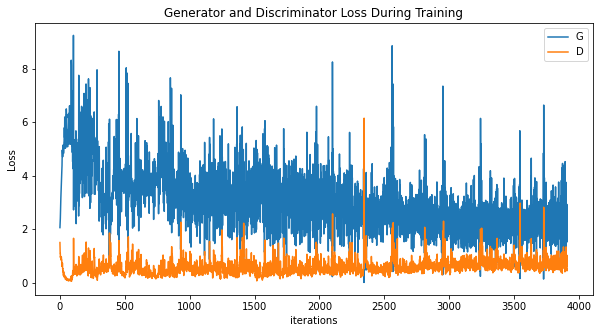

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Visualize Generated Images During and After Training

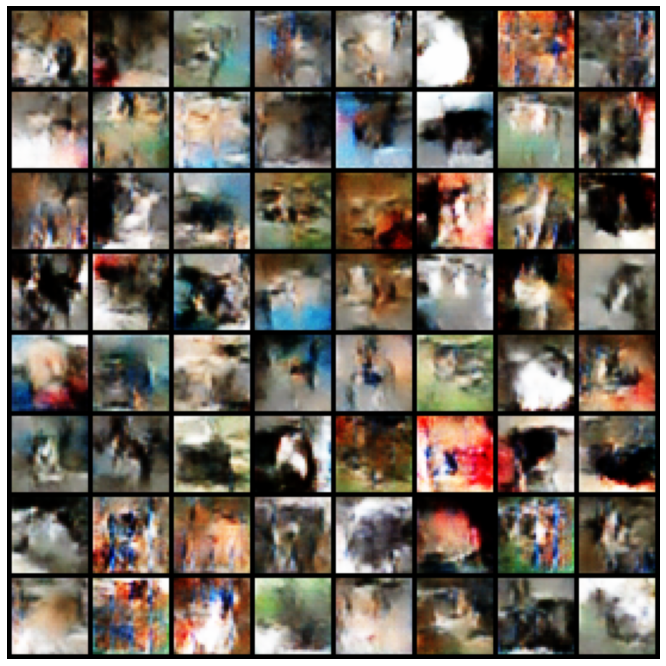

In [12]:
#%%capture
fig = plt.figure(figsize=(12,12))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())